# XAI for EarthExtremes


## Load libraries

In [1]:
#Autoreload .py files
%load_ext autoreload
%autoreload 2

#https://github.com/chmp/ipytest/issues/80
import sys
sys.breakpointhook = sys.__breakpointhook__

#https://github.com/Lightning-AI/lightning/issues/15254
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [2]:
import numpy as np
import pandas as pd
import os, sys, yaml
from pathlib import Path
from pprint import pprint
from datetime import datetime
import platform
import cartopy.crs as ccrs
import matplotlib.pyplot as plt, matplotlib as mpl
pd.set_option('display.max_columns', None)

from lovely_numpy import lo
import lovely_tensors as lt
lt.monkey_patch()

## Load configuration file

In [3]:
#Set up the paths
experiment_id= '2024_04_base'
experiment_path= f'./experiments/{experiment_id}/lightning_logs/version_0/hparams.yaml'

In [4]:
#Load used config
config= yaml.load(open(experiment_path,'rt'), Loader=yaml.FullLoader)['config']
config['experiment_id']= experiment_id
config['experiment_path']= experiment_path

#Set up the config so that XAI can use it
assert int(config['data']['compute']['low_res']) == 0, \
    'You are not evaluating at full resolution. If this is expected behavior, comment out this line'
config['implementation']['trainer']['train_batch_size']= 1
config['implementation']['trainer']['val_batch_size']= 1
config['implementation']['trainer']['test_batch_size']= 1
config['data']['compute']['return_as_pytorch']= True
config['data']['chunk_size']= None

## We have to do some modifications for the code to run on the DeepESDL server, since not all cubes can be available

In [55]:
#Paths
config['data']['datacubes_path']= str(Path('../'))
config['data']['registry_path']= str(
    Path('../deepextremes-minicubes/registry_2024_05_16_16_21_11.csv').expanduser().resolve())
config['data']['blacklist_path']= str(Path('./subsets/bad_cubes_final.txt').resolve())
config['data']['testlist_path']= None
config['data']['testlist_csv']= None

In [56]:
registry= pd.read_csv(config['data']['registry_path'])
registry.head(3)

,mc_id,path,location_id,version,geometry,creation_date,modification_date,events,s2_l2_bands,era5,cci_landcover_map,copernicus_dem,de_africa_climatology,event_arrays,s2cloudless_cloudmask,sen2cor_cloudmask,unetmobv2_cloudmask,earthnet_cloudmask,remarks
0,mc_0.25_31.25_0.3.3,deepextremes-minicubes/0.3.3/mc_0.25_31.25_0.3...,0.25_31.25,0.3.3,POLYGON ((0.2347963250286174 31.23674038090902...,2023-04-19 18:43:17,2023-04-19 18:43:17,"[(30750, '2020-08-16T00:00:00.0', '2020-08-23T...",1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,-1.0,NaN
1,mc_24.50_-14.50_0.3.3,deepextremes-minicubes/0.3.3/mc_24.50_-14.50_0...,24.50_-14.50,0.3.3,POLYGON ((24.48657339995221 -14.51311715391205...,2023-04-20 10:56:07,2023-04-20 10:56:07,"[(6772, '2016-10-10T00:00:00.0', '2016-11-03T0...",1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,-1.0,NaN
2,mc_26.50_8.75_0.3.4,deepextremes-minicubes/0.3.4/mc_26.50_8.75_0.3...,26.50_8.75,0.3.4,POLYGON ((26.486858196774257 8.736918157757508...,2023-04-21 12:34:10,2023-04-21 12:34:10,"[(35165, '2021-04-05T00:00:00.0', '2021-04-16T...",1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,NaN


In [58]:
#Download some cubes?
DOWNLOAD_CUBES= False
if DOWNLOAD_CUBES:
    
    from lib.download_cubes import aws_sync 
    from numpy.random import default_rng
    rng = default_rng(42)
    import tqdm
    
    #Get registry df
    registry= pd.read_csv(config['data']['registry_path'])
    
    #Get 100 arbitrary cubes
    locations= rng.integers(0, high=len(registry), size=100)
    ids= registry.iloc[locations].mc_id.values
    
    #Now get add some specific cubes related to the October 2020's Central South America Hetwave
    ids= [*ids] +\
    ['mc_-59.29_-24.07_1.3_20230916_0', 'mc_-59.67_-23.73_1.3_20230916_0', 'mc_-56.95_-25.91_1.3_20230916_0',
     'mc_-58.38_-25.26_1.3_20230916_0', 'mc_-57.54_-21.98_1.3_20230916_0', 'mc_-56.83_-24.86_1.3_20230916_0',
     'mc_-48.10_-21.49_1.2.2_20230705_0', 'mc_-59.12_-28.36_1.3_20230916_0', 'mc_-59.54_-24.36_1.3_20230916_0',
     'mc_-58.79_-23.98_1.3_20230916_0', 'mc_-58.47_-26.73_1.3_20230916_0', 'mc_-58.67_-25.10_1.3_20230916_0',
     'mc_-57.82_-25.67_1.3_20230916_0', 'mc_-58.42_-26.73_1.3_20230916_0', 'mc_-59.92_-27.12_1.3_20230916_0',
     'mc_-55.81_-25.51_1.3_20230916_0', 'mc_-47.74_-21.33_1.2.2_20230705_0', 'mc_-58.17_-23.98_1.3_20230916_0',
     'mc_-59.16_-26.48_1.3_20230916_0', 'mc_-59.00_-27.48_1.3_20230916_0', 'mc_-56.42_-24.11_1.3_20230916_0',
     'mc_-58.79_-25.73_1.3_20230916_0', 'mc_-57.45_-25.75_1.3_20230916_0', 'mc_-60.42_-27.23_1.3_20230916_0']
    
    #Download those cubes
    for cid in (pbar:=tqdm.tqdm(ids)):
        pbar.set_description(cid)
        aws_path= registry[registry.mc_id==cid].path.iloc[0].replace('deepextremes-minicubes', '')
        out= aws_sync(aws_path, f'../deepextremes-minicubes/{aws_path}', verbose=True)

In [59]:
#Get list of available cubes
cubes= list(Path(config['data']['datacubes_path']).glob('deepextremes-minicubes/*/*.zarr'))
cubes= [str(c)[3:] for c in cubes]

#Get registry and keep only the rows for those cubes
registry= pd.read_csv(config['data']['registry_path']) #Get registry df
registry_cubes= registry[registry.path.isin(cubes)]
print(f'Found {len(registry_cubes)} cubes')

#Save new registry
registry_cubes.to_csv('./subsets/registry.csv')
config['data']['registry_path']= str(Path('./subsets/registry.csv').expanduser().resolve())

Found 100 cubes


In [60]:
#Set low res to true to make everyting fit in VRAM
config['data']['compute']['low_res']= 2
#config['data']['compute']['ignore_first_N']= 73*3 #Ignore first 3 years of samples

## Get a model instance

For XAI to work, we need our model instance to be a `nn.Module` with a `forward` method that only takes some tensors as input, and returns a single tensor as output. Furthermore, all input tensors MUST be used in the model's computational graph in some way, or the XAI will throw errors. 

Our model alrady has such a `forward(t:Tensor, xy:Tensor, txy:Tensor) -> Tensor`, so no need to do anything but instantiate it

In [8]:
#Sometimes we have to provide this explictely
device= 'cuda:0' #'cuda:0', 'cpu'

#Load the model-related libs
from lib.model_manager import ModelManager

#Create model
model_manager= ModelManager(config)
model_manager.implement_model()
model_manager.load_last()
model_manager.model= model_manager.model.to(device)

#We need to run a single shared_step to setup the state of our model properly
model_manager.load_data()
out= model_manager.model.validation_step(next(iter(model_manager.val_loader)),0)
pprint(out)
del out

Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..


Loaded model from experiments/2024_04_base/checkpoints/last.ckpt
Found 74 minicubes with subset='train', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=219 from ..
Found 10 minicubes with subset='val', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=219 from ..
Found 99 minicubes with subset='test', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=219 from ..


/home/miguelangelft/.conda/envs/deepextremes_xai/lib/python3.9/site-packages/pytorch_lightning/core/module.py:436: You are trying to `self.log()` but the `self.trainer` reference is not registered on the model yet. This is most likely because the model hasn't been passed to the `Trainer`


{'labels': tensor[1, 5, 275, 64, 64] n=5632000 (21Mb) x∈[-0.012, 1.505] μ=0.301 σ=0.279 cuda:0,
 'output': tensor[1, 5, 275, 64, 64] n=5632000 (21Mb) x∈[-0.049, 0.762] μ=0.136 σ=0.089 cuda:0,
 'val_loss': tensor grad MeanBackward0 cuda:0 0.005}


If our forward method did not follow the convention, then we can just monkey-patch it here. Here is a simple example, in which the model's original `forward` method takes a dict of tensors, and returns a tensor and a dictionary. We reasign it to `_forward`, and replace it so that it takes some tensors as input, and returns a single tensor as output, as is expected by the XAI library (and by Captum)

```{python}
#Assign the current forward method to _forward()
#With forward having signature forward(data_dict:Dict[str,Tensor]) -> Tensor | Dict[str,Tensor]
task.model._forward= task.model.forward

#Now define a new forward method that just takes tensors as inputs and returs a tensor as output
#Also, output classes need to always be in position 1 so, we do the swap back and forth
#Finally, tensors that do not intervine in forward should not be passed, or XAI will complain and fail
def forward(self, data1, data2):
    preds, aux= self._forward({'data1': data1.swapaxes(1,2), 'data2': data2.swapaxes(1,2)})
    return preds.swapaxes(1,2)

#Assing the new mothod. Similar to: task.model.forward= forward, but doing it the right way
task.model.forward = forward.__get__(task.model, task.model.__class__)
```

## Set up the XAI configuration using the `config` dictionary

We need to edit the `configuration` file to include the further configuration regarding the XAI module.

In [12]:
#Import libraries
from lib.XAI import XAI, attribute
import torch

#Create xai configuration dictionary
config['xai']={}
#If debug is set to > 0, XAI will print some extra information when running, and will only run 1 sample
config['debug']= False

#We extract the final feature names from a dataset instance, because XAI lib will need them
data_names= model_manager.val_loader.dataset.data_names
features_txy= data_names['txy_real'] + data_names['txy_cat'] + data_names['txy_mask'] 
features_xy= data_names['xy_real'] + data_names['xy_cat']
features_t= data_names['t_real']
config['data']['input_features_flat']= features_t + features_xy + features_txy

#We change some feature names for better visualization
config['data']['input_features_flat']= ['cloudmask' if c.startswith('cloudmask') else 
                                        c.replace('lccs_class:','') if c.startswith('lccs') else c
                                        for c in config['data']['input_features_flat']]

#Here we can choose the attribution mode. For this example, only 'custom' and 'custom-full' will be used.
#Here is the whole list: ["none", "events[-full]", "correctness[-full]", "labels[-full]", "custom[-full]"]
# If 'custom', we need to provide an aggregation mask for every output channel. This mask will contain the
# output pixels over which the attribution will take place.
# If 'custom-full', we need to provide any number of attribution masks (one on a different channel). 
# This mask will contain the output pixels over which the attribution will take place. As comparted with
# 'custom' with 'custom-full', all combinations of output channel and aggregation mask will be computed
#Later on, we will see that this configuration will be overwritten depending on attribution experiment that
#we are performing
config['xai']['mask']= 'custom'

#Select xai method. Any from Captum, such as IntegratedGradients, InputXGradient, GradientShap, etc.
config['xai']['type']= 'IntegratedGradients'
#Extra parameters to pass to XAI method. Chooose internal_batch_size=1 of running out of memory
config['xai']['params']= {'n_steps':8, 'internal_batch_size':1} 

#Define RGB bands for plotting and attribution averaging.
#This only applies if the input or output channels are RGB, by setting here the name of the RGB bands
#the plotting can print them as RGB, BUT the attribution is also averaged over the RGB channels
config['xai']['in_channels_rgb_2d']= []
config['xai']['out_channels_rgb_2d']= [] 
config['xai']['in_channels_rgb_3d']= ['B04', 'B03', 'B02']
config['xai']['out_channels_rgb_3d']= []

#Choose percentage of attributions that get clipped out (does not affect nd plots or global attrs.)
config['xai']['outlier_percentage']= 1.

#Choose what plots to compute. We will only generate plots if they are activated here.
#Although these vales will be later redefined depending on the experiment
# - For local (cube-wise) attributions, we can plot: ['nd', '1d', '2d', '3d'], depending on the dim of the inputs
# - For global (average) attributions, we can plot: ['avg', 'dim-reduction', 'cluster']
config['xai']['plots']= ['avg', 'nd', '1d', '2d', '3d']

#Perform (if >1) structured downsampling of the data for global attribution
#This simply reduces the amount of pixels to consider to avoid running OOM
config['xai']['global_downsampling']= 1

#If true, rescales attribs. so that only non-zero inputs are considered 
#This is because 0 usually means that the input was not available
#However, this option can be wrong in many cases, so use with caution
config['xai']['non_zero_standarization']= True

#Ignore some output features / classes for attribution. If non-empty, we will not attribute wrt some classes,
#instead their attributions will just be filled with nans (improves efficiency, but NOT RAM footprint)
config['xai']['ignore_classes']= [0,1,2,3] #Leave only (k)NDVI, ignore the rest

#Clustering config
#One of https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html
config['xai']['clustering']= {}
config['xai']['clustering']['method']= 'KMeans' 
config['xai']['clustering']['params']= {'n_clusters':5, 'init':'k-means++', 
                                        'max_iter':300, 'random_state':config['seed']}
config['xai']['clustering']['plot_prototypes']= 3

#Dimensionality reduction config
config['xai']['dim-reduction']= {}
config['xai']['dim-reduction']['method']= 'PCA' 
config['xai']['dim-reduction']['params']= {} 

#This is a hack, since num_classes is 4, but we will also compute kNDVI on the fly
config['data']['output_classes']= ['B02', 'B03', 'B04', 'B8A', 'kNDVI'] 

#We may want to reduce some dimensions in the input, not only the output
#We have to select the input axes over which we want to aggregate for every input tensor
#as well as the aggregation function. As reference, inputs will have shape ([in x, in y, in t], in features)
#For now, we disable it by setting it to None, but in the experiments we will use it
config['xai']['agg_inputs']= None
config['xai']['agg_inputs_function']= 'mean' #'mean', 'min', 'max', 'minmax'

#Ignore some input classes for the purposes of plotting (the attributions must be computed anyway)
config['xai']['keep_input_features']= None

Generate XAI visualizations

In [14]:
#We must now create a DataLoader wrapper for the task 
from lib.data_utils import NDVI, ndvi, prepare_batch
from lib.XAI_deepextremes_loader import DeepExtremesXAILoader, empty_cache
dataset= model_manager.val_loader.dataset #Get dataset
empty_cache()

class XAIDataset(DeepExtremesXAILoader):
    def __init__(self, dataset, config, cubes, timesteps, device, history=None, 
                 N=100, subset='all', event_duration=None, debug=False, 
                 keep_classes=['grassland', 'broadtree', 'needletree', 'mixedtree'],
                 **kwargs):
        #We need to set up some class attributes
        #Set dataset, we need to reload the dataset since it is subset-dependent
        self.dataset= dataset.__class__(config, subset=subset, debug=debug)
        assert not self.dataset.return_just_cubes, 'Dataset must return (t, xy, txy)'
        
        #Set registry as a dataframe with index=['mc_id'], columns= ['path', 'start', 'end', 'class', 'event']
        self.registry= self.dataset.registry
        
        #The rest of the intialization is handled by the parent class
        super().__init__(dataset, config, cubes, timesteps, device, history=history, 
                 N=N, subset=subset, event_duration=event_duration, keep_classes=keep_classes, **kwargs)
        
    def _get_data(self, cid):
        #Get and process batch (in reality, a single element is returned)
        batch= self.dataset.__getitem__(cid)
        
        x, labels, masks, metric_masks, t_labels, t_dates_str, t, xy, txy= prepare_batch(
            batch, self.num_classes, self.dataset.pred_period, has_batch_dimension=False)
        batch= {k:v.to(self.device) if isinstance(v, torch.Tensor) else v for k,v in batch.items()} #Just in case

        #Add batch dimension
        masks, labels= masks[None], labels[None]

        #Input stuff
        final_batch= {}
        final_batch['x']= tuple([xi[None] for xi in x])
        
        cid_true= batch['meta']['id'].split('/')[-1].replace('.zarr', '')
        event_labels= batch['meta']['event_labels']
        # print(f'{cid_true}: {t_dates_str=}')
        
        return final_batch, labels, masks, cid_true, event_labels

    def _postprocess_data(self, final_batch, timestep=None):
        #We add NDVI and extend masks accordingly
        # final_batch['masks']= torch.cat([final_batch['masks'], final_batch['masks'][:,[0]]], axis=1)
        if not self.full: #If not using -full, we need to account for NDVI
            final_batch['agg_mask']= torch.cat([final_batch['agg_mask'], final_batch['agg_mask'][:,[0]]], axis=1)
        final_batch['labels']= torch.cat([final_batch['labels'], 
                              ndvi(final_batch['labels'][:,[2]], final_batch['labels'][:,[3]])], axis=1)
        
        #Get only some `history` timesteps around the event for XAI
        if self.history is not None:
            if isinstance(timestep, slice): t0= timestep.start
            else: t0= timestep
            xai_ts= np.s_[max(0, t0 + self.history[0]):
                          min(final_batch['x'][0].shape[2], t0 + self.history[1])]
            final_batch['x']= (final_batch['x'][0][:,:,xai_ts], final_batch['x'][1], 
                               final_batch['x'][2][:,:,xai_ts])
            for n in ['masks', 'agg_mask', 'labels']: 
                final_batch[n]= final_batch[n][:,:,xai_ts]

        return final_batch

#Test XAIDataset
DEXAI= XAIDataset(dataset, config, [str(Path(cubes[0]).stem)], [250], device=device, 
                  history=(-100, 10), subset='test', debug=False, debug_on_error=False)
pprint(DEXAI[0])

Found 99 minicubes with subset='test', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=219 from ..
Cannot filter out classes not in keep_classes=['grassland', 'broadtree', 'needletree', 'mixedtree'] because registry does not have class column
Explaining 1 cubes
{'agg_mask': tensor[1, 5, 110, 64, 64] n=2252800 (8.6Mb) x∈[0., 1.000] μ=0.009 σ=0.095,
 'event_name': ['mc_25.63_67.58_1.1_20230611_0-timestep=250'],
 'labels': tensor[1, 5, 110, 64, 64] n=2252800 (8.6Mb) x∈[-0.085, 1.880] μ=0.281 σ=0.301,
 'masks': tensor[1, 5, 110, 64, 64] bool n=2252800 (2.1Mb) x∈[False, True] μ=0.475 σ=0.499,
 'x': (tensor[1, 24, 110] n=2640 (10Kb) x∈[-1.515, 0.987] μ=0.205 σ=0.385,
       tensor[1, 35, 64, 64] n=143360 (0.5Mb) x∈[0., 1.000] μ=0.029 σ=0.166,
       tensor[1, 9, 110, 64, 64] n=4055040 (15Mb) x∈[-0.085, 1.880] μ=0.331 σ=0.319)}


In [ ]:
assert False, 'Stop execution here to decide which experiment to run'

## Experiments

### Experiment 1: Local attributions

Explain a specific timestep of a specific minicube. We need to set a manual list of cubes + timesteps to explain.

In [22]:
#Set up: cube ids + timesteps to explain
test_cubes=[str(Path(c).stem) for c in cubes[50:51]]
test_timesteps=[150] #Each timestep applies to each minicube id respectively
history= (-74, 10) #How much history to consider for explainability (if high, we will run OOM). None to disable

#Overwrite config
config['xai']['in_channels_rgb_3d']= ['B04', 'B03', 'B02']
config['xai']['plots']= ['nd', '1d', '2d', '3d'] #Only local attributions
config['xai']['mask']= 'custom'
config['xai']['agg_classes']= [None] #Custom names for the final XAI aggregation classes, or None for default
config['xai']['agg_inputs']= None
config['xai']['keep_input_features']= None

DEXAI= XAIDataset(dataset, config, test_cubes, test_timesteps, device=device, 
                  history=history, subset='test', debug=False)

Found 99 minicubes with subset='test', versions=None, self.test_start_date=datetime.datetime(2021, 10, 8, 0, 0), self.ignore_first_N=219 from ..
Cannot filter out classes not in keep_classes=['grassland', 'broadtree', 'needletree', 'mixedtree'] because registry does not have class column
Explaining 1 cubes


In [23]:
#Create a XAI instance
xai= XAI(config, model_manager.model, DEXAI)

#Attribute
empty_cache()
attributions, inputs, labels, predictions, masks, x_shapes, y_shape= attribute(xai.config, xai.model, xai.loader,
   xai.num_classes, xai.out_agg_dim, xai.agg_mode, ignore_classes=xai.ignore_classes, events=None, debug=False)

Explaining Dataloader: [event_name=['mc_25.63_67.58_1.1_20230611_0-timestep=150']]: 100%|██████████| 1/1 [00:07<00:00,  7.62s/it]


Attribution outputs:
- `attributions`: dict (over event ids) of lists of arrays with shape ([out x, out y, out t], out classes, [in x, in y, in t], in features)
- `inputs`: dict (over event ids) of lists of arrays with shape ([in x, in y, in t], in features)
- `labels`: dict (over event ids) of arrays with shape ([out x, out y, out t], [out classes])
- `masks`: dict (over event ids) of arrays with shape ([out x, out y, out t], [out classes])
- `predictions`: dict (over event ids) of arrays with shape ([out x, out y, out t], out classes)

In [24]:
#Let's take a look at the outupts for the first event
for arr, name in zip([attributions, inputs],['attributions', 'inputs']):
    for i, arr_i in enumerate(arr):
        event= next(iter(arr_i.keys()))
        print(f' - {name}[{i}]["{event}"]:\n     {lo(arr_i[event])}')
    print('')
        
for arr, name in zip([labels, masks, predictions],['labels', 'masks', 'predictions']):
    event= next(iter(arr.keys()))
    print(f' - {name}[{i}]["{event}"]:\n     {lo(arr[event])}\n')

 - attributions[0]["mc_25.63_67.58_1.1_20230611_0-timestep=150"]:
     array[1, 84, 24] n=2016 (16Kb) x∈[-0.069, 0.052] μ=0.000 σ=0.008
 - attributions[1]["mc_25.63_67.58_1.1_20230611_0-timestep=150"]:
     array[1, 64, 64, 35] n=143360 (1.1Mb) x∈[-4.526e-05, 2.494e-05] μ=-4.576e-08 σ=1.832e-06
 - attributions[2]["mc_25.63_67.58_1.1_20230611_0-timestep=150"]:
     array[1, 64, 64, 84, 9] n=3096576 (24Mb) x∈[-0.001, 0.000] μ=2.270e-07 σ=7.226e-06

 - inputs[0]["mc_25.63_67.58_1.1_20230611_0-timestep=150"]:
     array[84, 24] f32 n=2016 (7.9Kb) x∈[-1.527, 0.987] μ=0.207 σ=0.395
 - inputs[1]["mc_25.63_67.58_1.1_20230611_0-timestep=150"]:
     array[64, 64, 35] f32 n=143360 (0.5Mb) x∈[0., 1.000] μ=0.029 σ=0.166
 - inputs[2]["mc_25.63_67.58_1.1_20230611_0-timestep=150"]:
     array[64, 64, 84, 9] f32 n=3096576 (12Mb) x∈[-0.088, 1.651] μ=0.322 σ=0.321

 - labels[2]["mc_25.63_67.58_1.1_20230611_0-timestep=150"]:
     array[64, 64, 84, 1] f32 n=344064 (1.3Mb) x∈[0., 0.762] μ=0.096 σ=0.174

 - 

In [25]:
#Visualize
(attributions_global, inputs_global, labels_global, predictions_global, masks_global, feature_names_global, 
     x_shapes_global, event_names)= xai.xai(data=(attributions, inputs, labels, predictions, masks, x_shapes, y_shape))

 > Stacking global arrays


agg-custom [IntegratedGradients] [-2.17E-05 - 2.45E-05] [input 3] mc_25.63_67.58_1.1_20230611_0-timestep=150 3d


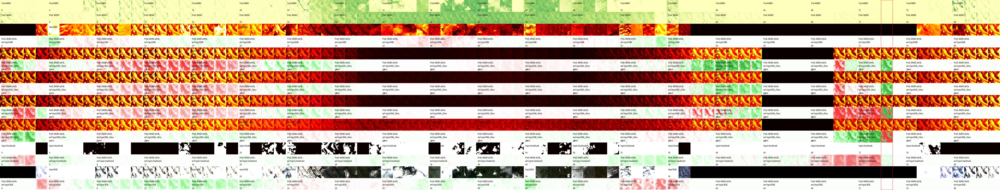

agg-custom [IntegratedGradients] [-3.04E-02 - 4.21E-02] [input 1] mc_25.63_67.58_1.1_20230611_0-timestep=150 nd


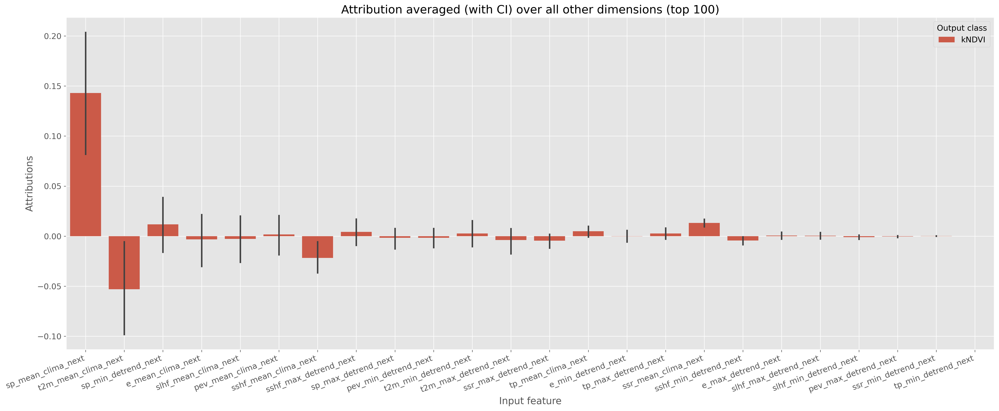

agg-custom [IntegratedGradients] [-1.05E-05 - 8.06E-06] [input 2] mc_25.63_67.58_1.1_20230611_0-timestep=150 nd


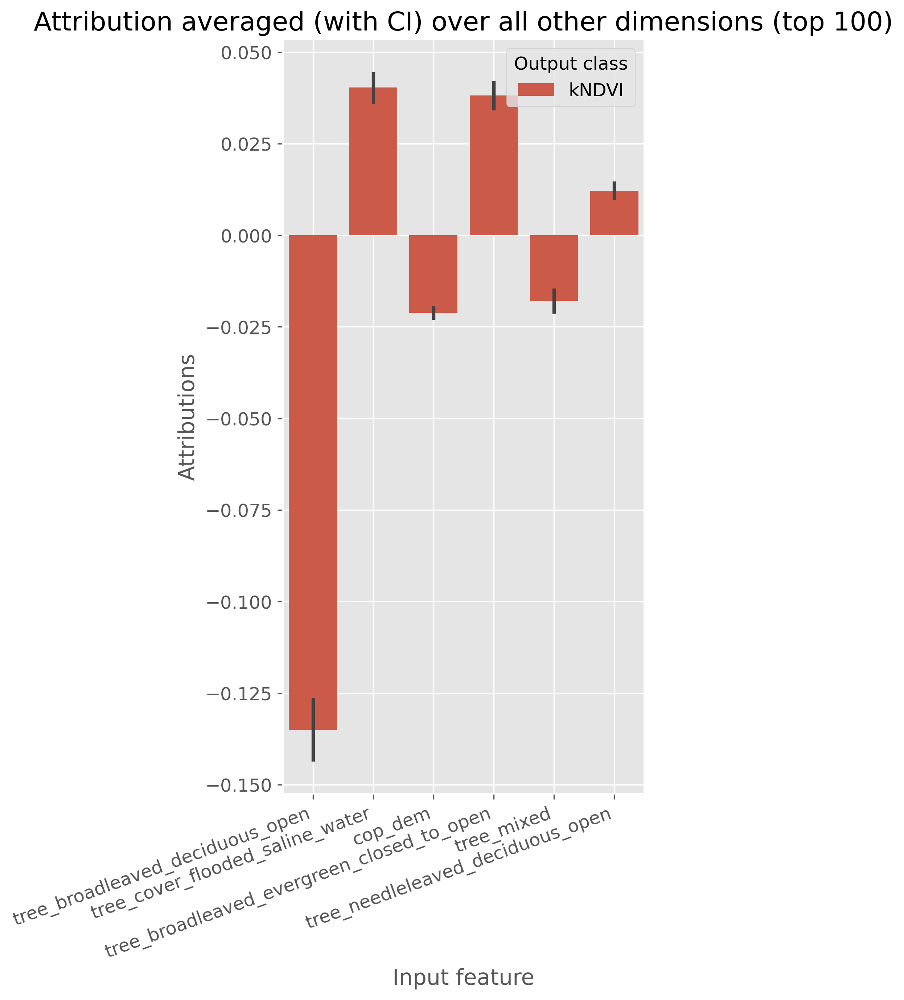

agg-custom [IntegratedGradients] [-1.05E-05 - 8.06E-06] [input 2] mc_25.63_67.58_1.1_20230611_0-timestep=150 2d


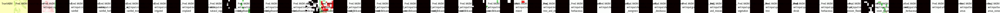

agg-custom [IntegratedGradients] [-2.17E-05 - 2.45E-05] [input 3] mc_25.63_67.58_1.1_20230611_0-timestep=150 nd


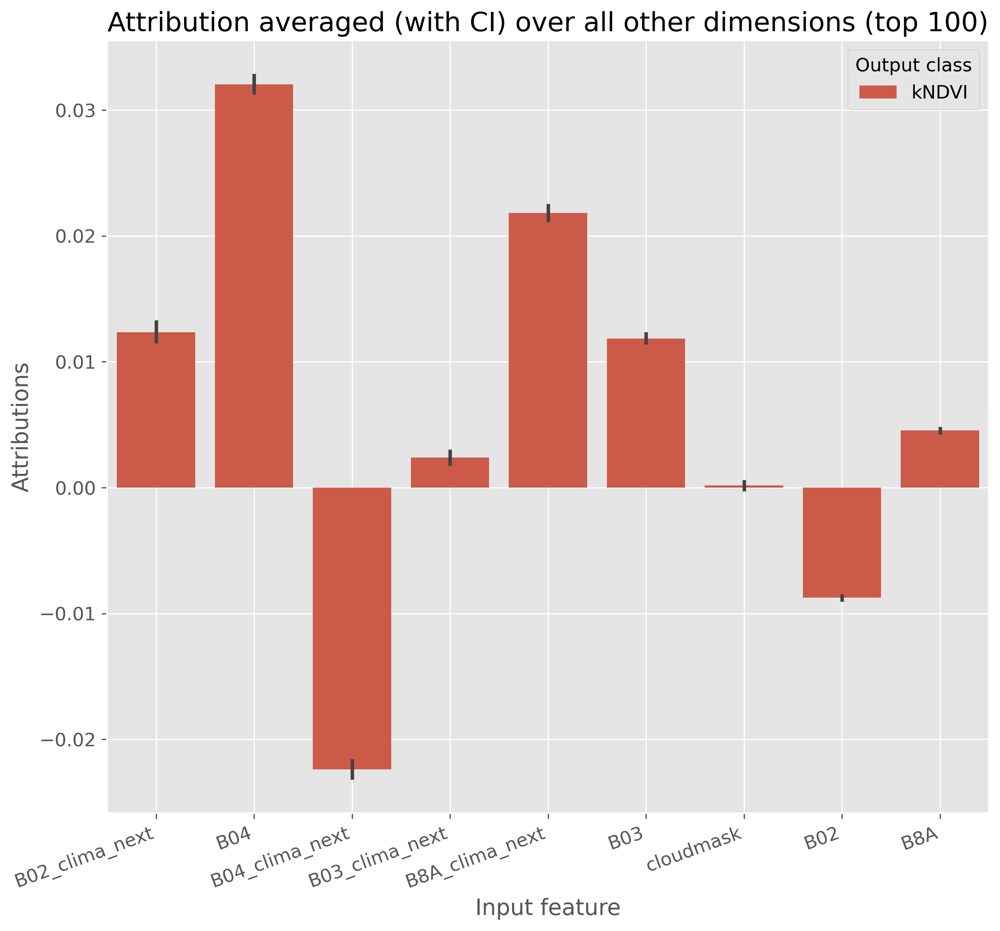

agg-custom [IntegratedGradients] [-3.04E-02 - 4.21E-02] [input 1] mc_25.63_67.58_1.1_20230611_0-timestep=150 1d


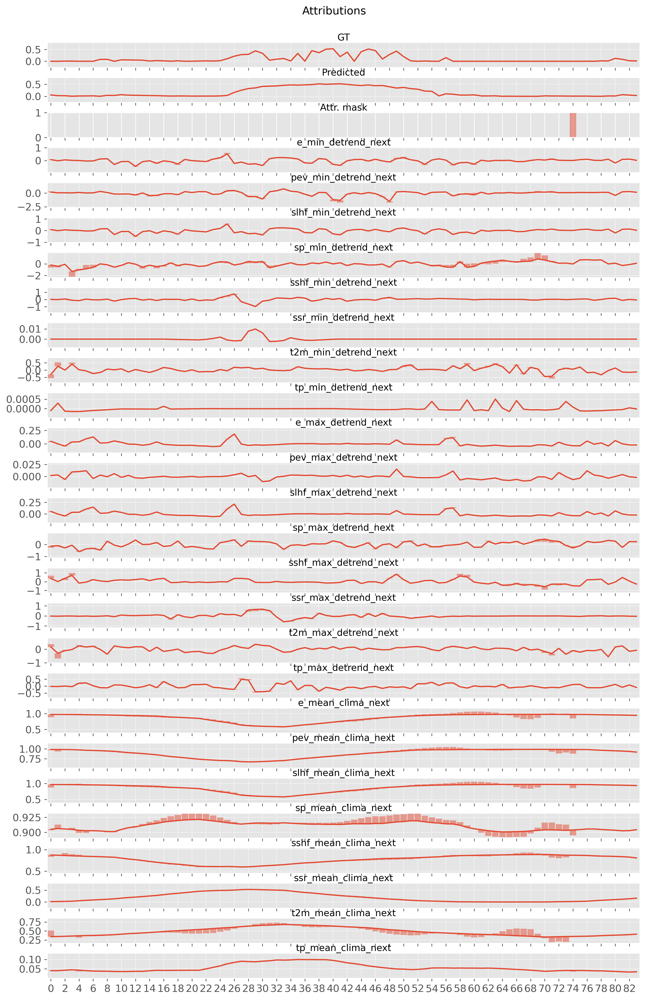

In [26]:
#We now grab the generated images and plot them here
#Double click on the images to see them full size
from IPython.display import Image, display
from pathlib import Path
image_list= list((Path('experiments') / config['experiment_id'] / 'xai').glob('*.png'))
for img in image_list: #Limit to first cube
    print(img.stem)
    display(Image(filename=str(img), alt=str(img)))

### Experiment 2: Global average attributions

Here, we select a random subset of test cubes (N=250), and perform global average attributions over a month of outputs (starting at output position `timestep`).

In [ ]:
#Set up
subset= 'val' #'test' or 'val'
timestep= 320
history= (-100, 10)

#Overwrite config
config['xai']['in_channels_rgb_3d']= ['B04', 'B03', 'B02']
config['xai']['plots']= ['avg', 'dim-reduction', 'cluster']
config['xai']['mask']= 'custom'
config['xai']['agg_classes']= [None]
#Input's shape: ([in x, in y, in t], in features)
config['xai']['agg_inputs']= [[], [0,1], [0,1]] #[[0], [0,1], [0,1,2]] 
config['xai']['agg_inputs_function']= 'mean' #'mean', 'min', 'max', 'minmax'
config['xai']['keep_input_features']= None

#Explain a random month of predictions for every cube
DEXAI= XAIDataset(dataset, config, f'{subset}_random', timestep, device=device, N=100,
                  history=history, subset=subset, debug=False)

In [ ]:
#Create a XAI instance
xai= XAI(config, model_manager.model, DEXAI)

In [ ]:
#Attribute
empty_cache()
attributions, inputs, labels, predictions, masks, x_shapes, y_shape= attribute(xai.config, xai.model, xai.loader,
   xai.num_classes, xai.out_agg_dim, xai.agg_mode, ignore_classes=xai.ignore_classes, events=None, debug=False)

In [ ]:
#Visualize: we here repeat the analysis for a different number of clusters each time
n_clusters= np.array([2,3,4,5,6])
for nc in n_clusters:
    xai.clustering_params['n_clusters']= nc #We hot-patch the number of clusters
    (attributions_global, inputs_global, labels_global, predictions_global,
      masks_global, feature_names_global, x_shapes_global, event_names
        )= xai.xai(data=(attributions, inputs, labels, predictions, masks, x_shapes, y_shape));

In [ ]:
#We can plot silhouette scores to help choose best number of clusters, but we need to input them here manually
if False:
    import seaborn as sns
    sc_scores= [0.5041, 0.4359, 0.4409, 0.4467, 0.3357, 0.3254]
    diff= np.diff([sc_scores[0]] + sc_scores)

    fig, ax1 = plt.subplots(figsize=(6,4))
    sns.barplot(x=n_clusters, y=sc_scores)
    plt.ylabel('Silhouette score')
    plt.xlabel('Number of clusters')
    plt.show()

### Experiment 3: Global attributions based on landcover class

Here, we select random subsets of test cubes (N=20), each belonging to a different pure land-cover (one of `['soil', 'grassland', 'broadtree', 'needletree', 'urban', 'mixedtree']`), and aggregate the outputs with respect to those

In [ ]:
#Set up
subset= 'val' #'test' or 'val'
timestep= 320 #'random' or 'fixed'
history= (-100, 10)
lc_classes= ['soil', 'grassland', 'broadtree', 'needletree', 'urban', 'mixedtree']

#Overwrite config
config['xai']['in_channels_rgb_3d']= ['B04', 'B03', 'B02']
config['xai']['plots']= ['avg'] #, 'dim-reduction', 'cluster'
config['xai']['mask']= 'custom-full' 
config['xai']['agg_classes']= lc_classes
config['xai']['agg_inputs']= [[], [0,1], [0,1]]
config['xai']['agg_inputs_function']= 'mean' #'mean', 'min', 'max', 'minmax'
config['xai']['keep_input_features']= None

DEXAI= XAIDataset(dataset, config, f'{subset}_landcover_random', timestep, 
                  device, N=20, history=history, subset=subset, debug=False, keep_classes=lc_classes)

In [ ]:
#Create a XAI instance
xai= XAI(config, model_manager.model, DEXAI)

#Attribute
empty_cache()
attributions, inputs, labels, predictions, masks, x_shapes, y_shape= attribute(xai.config, xai.model, xai.loader,
   xai.num_classes, xai.out_agg_dim, xai.agg_mode, ignore_classes=xai.ignore_classes, events=None, debug=False)

#Visualize
(attributions_global, inputs_global, labels_global, predictions_global, masks_global, feature_names_global, 
     x_shapes_global, event_names)= xai.xai(data=(attributions, inputs, labels, predictions, masks, x_shapes, y_shape))

### Experiment 4: Global event-dependent attributions

Here, we select a random subset of test cubes (N=25) belonging to a specific `event_id`, and then compute the average attributions for the timefranes: `['event', 'year-before', 'before', 'after']` to see how the attributions change. More precisely:
 - `event` the period during which the event happened
 - `year-before` same period as the event, but exactly one year before
 - `before` same period as the event, but finishing exactly where the event starts
 - `after` same period as the event, but strating exactly where the event finishes

In [ ]:
print(f'{features_t=}\n\n{features_xy=}\n\n{features_txy=}')

In [ ]:
#Set up
history= (-73*2, 10) #(-73, 15)
timestep_mode= ['event', 'year-before'] #['event', 'year-event', 'before', 'year-before', 'after', 'year-after'] 
event_id= 31833 #32379, 31833

#Overwrite config
config['xai']['in_channels_rgb_3d']= []
config['xai']['agg_classes']= timestep_mode
config['xai']['plots']= ['nd', '1d', '2d', '3d', 'avg'] 
config['xai']['mask']= 'custom-full' 
config['xai']['agg_inputs']= None #[[], [0,1], [0,1]] #None
config['xai']['agg_inputs_function']= 'mean' #'mean', 'min', 'max', 'minmax'
config['xai']['keep_input_features']= \
    [ ['t2m_mean_clima_next', 'sp_mean_clima_next', 'sshf_mean_clima_next','e_min_detrend_next',
       'slhf_min_detrend_next'], None, ['B04', 'B8A', 'B04_clima_next', 'B8A_clima_next']]

#Note that we must disable debug_on_error, since many cubes that have an event according to the
#registry, end up not having it in the actual minicube metadata
DEXAI= XAIDataset(dataset, config, event_id, timestep_mode, device, N=131, event_duration=10,
                  history=history, subset='test', debug=False, debug_on_error=False)

In [ ]:
#Create a XAI instance
xai= XAI(config, model_manager.model, DEXAI)

In [ ]:
#Attribute
empty_cache()
attributions, inputs, labels, predictions, masks, x_shapes, y_shape= attribute(xai.config, xai.model, xai.loader,
   xai.num_classes, xai.out_agg_dim, xai.agg_mode, ignore_classes=xai.ignore_classes, events=None, debug=False)

In [ ]:
#Visualize
(attributions_global, inputs_global, labels_global, predictions_global, masks_global, feature_names_global, 
     x_shapes_global, event_names)= xai.xai(data=(attributions, inputs, labels, predictions, masks, x_shapes, y_shape))

In [ ]:
#Print minicube ids
[a.split('-timestep')[0] for a in attributions[0].keys()]